<a href="https://colab.research.google.com/github/milipaget/PASA-2023/blob/main/TP_3_PASA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**Trabajo Práctico N°3 - Predicción lineal**
> ### Paget, Milagros 61449
> ### Voss, María de Guadalupe 61583

En este trabajo se aplicará predicción lineal a señales de voz.

In [1]:
!pip install arch

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 981.7/981.7 kB 11.9 MB/s eta 0:00:00


In [2]:
#Se importan las bibliotecas necesarias.
import numpy as np
import scipy as scipy
import matplotlib.pyplot as plt
from IPython.display import Audio
from scipy.io import wavfile
from scipy.linalg import solve_toeplitz
import scipy.signal as signal
from arch.unitroot import unitroot

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Sonidos grabados
Se comienza cargando las grabaciones de sonidos /a/ y /sh/.

In [4]:
#Configuración básica de los audios
fs = 16000    #frecuencia de muestreo
duration = 1  #segundos
numSamples = int(duration * fs)
time = np.linspace(0, duration, numSamples, endpoint=False)

In [5]:
#Se utiliza esta función para pasara de audio estéreo a mono.
def audioToMono(audio):
  if audio.ndim == 2:
      audio = np.mean(audio, axis=1)
  else:
      audio = audio
  return audio

In [6]:
#Se cargan las grabaciones realizadas
fs, signalA = wavfile.read('/content/drive/My Drive/TP3 PASA/signalA.wav')
signalA = audioToMono(signalA)

outputFilename = "singalA.wav"
wavfile.write(outputFilename, fs, np.int16(signalA/(np.max(abs(signalA)))* 32767))

audio = Audio("singalA.wav")
display(audio)

In [7]:
fs, signalSH = wavfile.read('/content/drive/My Drive/TP3 PASA/signalSH.wav')
signalSH = audioToMono(signalSH)

outputFilename = "singalSH.wav"
wavfile.write(outputFilename, fs, np.int16(signalSH/(np.max(abs(signalSH)))* 32767))

audio = Audio("singalSH.wav")
display(audio)

In [8]:
#Normalizo y les resto la media
signalA_Norm = ((signalA - np.mean(signalA))/np.max(signalA))
signalSH_Norm = ((signalSH - np.mean(signalSH))/np.max(signalSH))

## Predicción forward
Para poder realizar la predicción lineal forward se debe verificar que las señales sean estacionarias. A continuación se realizan pruebas de estacionaridad.

In [28]:
# Realizo la prueba de raíz unitaria ADF con arch.unitroot para ambas señales
adf_A = unitroot.ADF(signalA_Norm)
adf_SH = unitroot.ADF(signalSH_Norm)

print("Prueba ADF: resultados para la señal /a/:")
print("Estadística de prueba ADF:", adf_A.stat)
print("Valor crítico al 1%:", adf_A.critical_values['1%'])

# Compara la estadística de prueba con el valor crítico al 1%
if adf_A.stat < adf_A.critical_values['1%']:
    print("Con la prueba ADF la señal /a/ es estacionaria al 1% de confianza.")
else:
    print("Con la prueba ADF la señal /a/ no es estacionaria al 1% de confianza.")

print("")

print("Prueba ADF: resultados para la señal /sh/ en la ventana de tiempo:")
print("Estadística de prueba ADF:", adf_SH.stat)
print("Valor crítico al 1%:", adf_SH.critical_values['1%'])

# Compara la estadística de prueba con el valor crítico al 1%
if adf_SH.stat < adf_SH.critical_values['1%']:
    print("Con la prueba ADF la señal /sh/ es estacionaria al 1% de confianza.")
else:
    print("Con la prueba ADF la señal /sh/ no es estacionaria al 1% de confianza.")

Prueba ADF: resultados para la señal /a/:
Estadística de prueba ADF: -38.44705859917082
Valor crítico al 1%: -3.4304890026320067
Con la prueba ADF la señal /a/ es estacionaria al 1% de confianza.

Prueba ADF: resultados para la señal /sh/ en la ventana de tiempo:
Estadística de prueba ADF: -25.718779975525393
Valor crítico al 1%: -3.430486044294434
Con la prueba ADF la señal /sh/ es estacionaria al 1% de confianza.


Dado que los test demuestran estacionaridad, se aplica predicción forward.

In [65]:
#Función para graficar J en función de M
def graphJvsM(data, title):
  # Definir un rango de valores de M a evaluar
  rango_M = range(1, 500, 1)

  # Inicializar una lista para almacenar los valores de MSE para cada M
  Jo_values = []

  R = signal.correlate(data, data, mode='full')[len(data)-1:]/len(data)
  rf = np.conjugate(R)
  var = np.var(data)

  # Loop para calcular el J para cada valor de M
  for M in rango_M:
      RAux = R[:M]
      rfAux = rf[1:M+1]
      a = solve_toeplitz(RAux, (-1)*rfAux)

      # Calcular el MMSE entre la señal filtrada estimada y la grabación
      Jo = var + np.dot(rfAux, np.transpose(a))

      # Registrar el valor de MMSE para este valor de M
      Jo_values.append(Jo)

  plt.plot(rango_M[:len(Jo_values)], Jo_values, color='indigo')
  plt.title(title)
  plt.xlabel('M')
  plt.ylabel('J')
  plt.yscale('log')

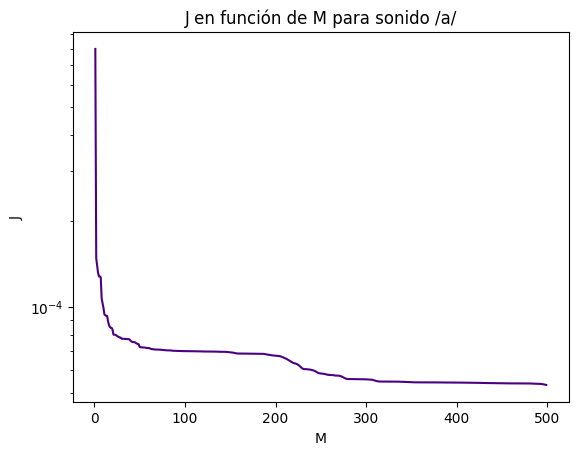

In [66]:
graphJvsM(signalA_Norm, 'J en función de M para sonido /a/')

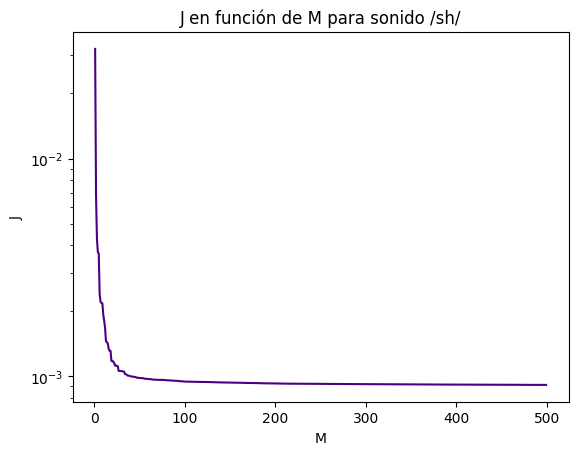

In [67]:
graphJvsM(signalSH_Norm, 'J en función de M para sonido /sh/')

Como se puede ver en los gráficos de J en función del orden del filtro estos presentan codos.

> Para el caso del sonido /a/ se presentan dos codos: el primero alrededor de M = 15 y el segundo alrededor de M = 250. El primer codo indica que hay una mejora al aumentar el orden del filtro, sin embargo el segundo demuestra que un aumento mayor del orden no es indicio de mejoras en la predicción.

> Para el caso del sonido /sh/ se presenta un codo alrededor de M = 10. A modo de comparación, al poseer un codo nomás podría indicar que esta señal requiere de un modelo más simple para que se ajuste a sus características.

A continuación se analiza la señal de error de predicción.


In [13]:
def forwardPredictionFilter(data, M):
  R = signal.correlate(data, data, mode='full')[len(data)-1:]/len(data)
  rf = np.conjugate(R)
  var = np.var(data)

  RAux = R[:M]
  rfAux = rf[1:M+1]
  a = solve_toeplitz(RAux, (-1)*rfAux)
  a_hat = np.insert(a, 0, 1)

  Jo = var + np.dot(rfAux, np.transpose(a))

  return a, a_hat, Jo

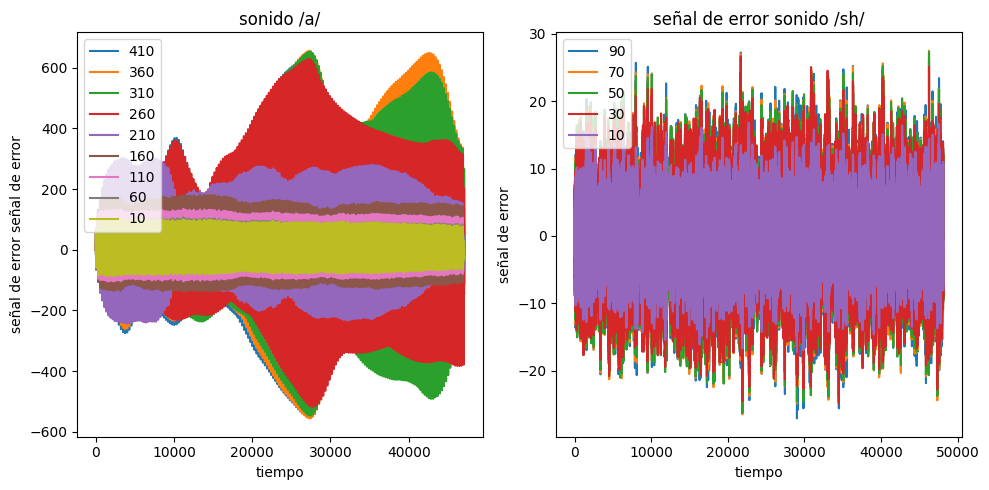

In [96]:
#Gráficos de las señales de error
plt.figure(figsize=(10, 5))  # Tamaño de la figura
rango_M = range(10, 450, 50)

plt.subplot(1, 2, 1)
for i in range(8, -1, -1):
  aA, a_hatA, JoA = forwardPredictionFilter(signalA_Norm, rango_M[i])
  efA = scipy.signal.lfilter([1], a_hatA, signalA_Norm)
  plt.plot(efA, label=rango_M[i])  # Graficar datos en el primer subplot
  plt.xlabel('tiempo')
  plt.ylabel('señal de error señal de error')
  plt.title('sonido /a/')
plt.legend()


rango_M = range(10, 120, 20)
plt.subplot(1, 2, 2)
for i in range(4, -1, -1):
  aSH, a_hatSH, JoSH = forwardPredictionFilter(signalSH_Norm, rango_M[i])
  efSH = scipy.signal.lfilter([1], a_hatSH, signalSH_Norm)
  plt.plot(efSH, label=rango_M[i])  # Graficar datos en el primer subplot
  plt.xlabel('tiempo')
  plt.ylabel('señal de error')
  plt.title('señal de error sonido /sh/')
plt.legend()

plt.tight_layout()

# Mostrar la figura con los dos subplots.
plt.show()

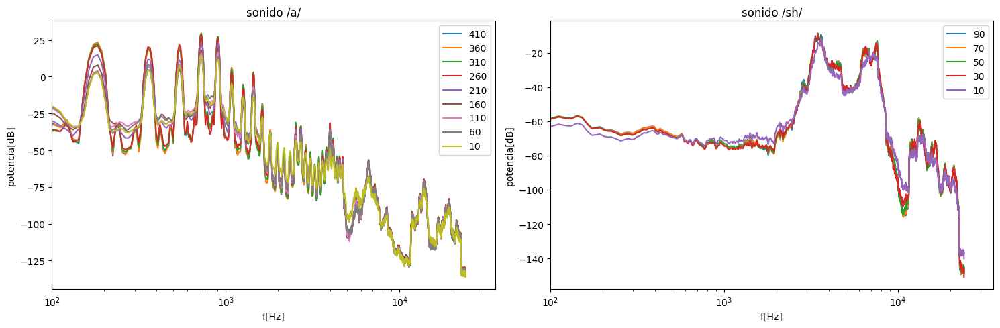

In [97]:
#Gráficos de las señales de error
plt.figure(figsize=(15, 5))  # Tamaño de la figura
rango_M = range(10, 450, 50)

plt.subplot(1, 2, 1)
for i in range(8, -1, -1):
  aA, a_hatA, JoA = forwardPredictionFilter(signalA_Norm, rango_M[i])
  efA = scipy.signal.lfilter([1], a_hatA, signalA_Norm)
  nperseg = int(len(efA)/10)  # Tamaño de la ventana para el cálculo del espectro
  noverlap = int(nperseg/2)  # Solapamiento entre ventanas
  fA, pA_error = scipy.signal.welch(efA, fs, window='parzen', nperseg=nperseg, noverlap=noverlap)

  plt.plot(fA, 10*np.log10(pA_error), label=rango_M[i])  # Graficar datos en el primer subplot
  plt.xlabel('f[Hz]')
  plt.ylabel('potencia[dB]')
  plt.title('sonido /a/')
  plt.xscale('log')
  plt.xlim(100,)
plt.legend()


rango_M = range(10, 120, 20)
plt.subplot(1, 2, 2)
for i in range(4, -1, -1):
  aSH, a_hatSH, JoSH = forwardPredictionFilter(signalSH_Norm, rango_M[i])
  efSH = scipy.signal.lfilter([1], a_hatSH, signalSH_Norm)
  nperseg = int(len(efA)/10)  # Tamaño de la ventana para el cálculo del espectro
  noverlap = int(nperseg/2)  # Solapamiento entre ventanas
  fSH, pSH_error = scipy.signal.welch(efSH, fs, window='parzen', nperseg=nperseg, noverlap=noverlap)

  plt.plot(fSH, 10*np.log10(pSH_error), label=rango_M[i])  # Graficar datos en el primer subplot
  plt.xlabel('f[Hz]')
  plt.ylabel('potencia[dB]')
  plt.title('sonido /sh/')
  plt.xscale('log')
  plt.xlim(100,)
plt.legend()

plt.tight_layout()

# Mostrar la figura con los dos subplots.
plt.show()

> Se puede ver que para el caso de la señal /a/ a medida que se aumenta el M también lo hace la señal de error. Para valores posteriores al primer codo se puede ver que, si bien aumenta levemente su amplitud, el comportamiento de la señal de error es muy similar. Sin embargo, se nota que por encima de 200 (aproximadamente donde aparece el segundo codo) el error comienza a comportarse no uniformemente y aumenta significativamente su amplitud. En los periodogramas de la señal de error puede verse que superando el segundo codo todos comienzan a ser muy parecidos entre sí pero muy diferentes a los de M menor.

> Por otro lado, para la señal /sh/ se nota que ya por encima de M = 30 no se ven mayores cambios en la señal de error. Puede verse también que los periodogramas de las diferentes señales de error son altamente semejantes al superar el codo. Esto demuestra que el aumento del orden del filtro no implica una mejora del predictor.





Por ende puede concluirse que estos codos están estrechamente relacionados con la dependencia de M de la señal de error.

ACA CHAMUYAR UN TOQUE MAS AHRE NO SE Q INVENTAR

## Respuesta en frecuencia del filtro del error de predicción


In [14]:
def graphHandJ(signal):
  M_array = [1, 2, 4, 8, 16, 32, 64]
  labels = ["M = 1", "M = 2", "M = 4", "M = 8", "M = 16", "M = 32", "M = 64"]
  Jo_values = []
  # Frecuencias angulares desde 0 a pi (0 a 180 grados)
  omega = np.linspace(0, np.pi, num=10000)
  fig = plt.figure(figsize=(10, 5))

  w = scipy.signal.get_window('parzen', len(signal))

  signalFFT = scipy.fft.fft(w*signal)
  freqFFT = scipy.fft.fftfreq(len(signalFFT), 1/fs)
  freqFFT = freqFFT[:len(freqFFT)//2-1]
  signalFFT = signalFFT[:len(signalFFT)//2-1:]
  plt.plot(freqFFT, 20*np.log10(1/np.abs(signalFFT)), label='FFT')

  for i, M in enumerate(M_array):
    a, a_hat, Jo= forwardPredictionFilter(signal, M)
    ef = scipy.signal.lfilter([1], a_hat, signal)
    exp_values = np.exp(1j * omega)
    a_hat_H = np.polyval(a_hat, exp_values) / np.polyval([1], exp_values)
    frequencies = omega  * fs * 1.0 / (2 * np.pi)

    Jo_values.append(Jo)
    plt.plot(frequencies, 20*np.log10(np.abs(a_hat_H)), label=labels[i])

  plt.title('Respuesta en frecuencia del filtro de error')
  plt.xlabel('f[Hz]')
  plt.ylabel('H(jw)[dB]')
  plt.legend()
  plt.xscale('log')


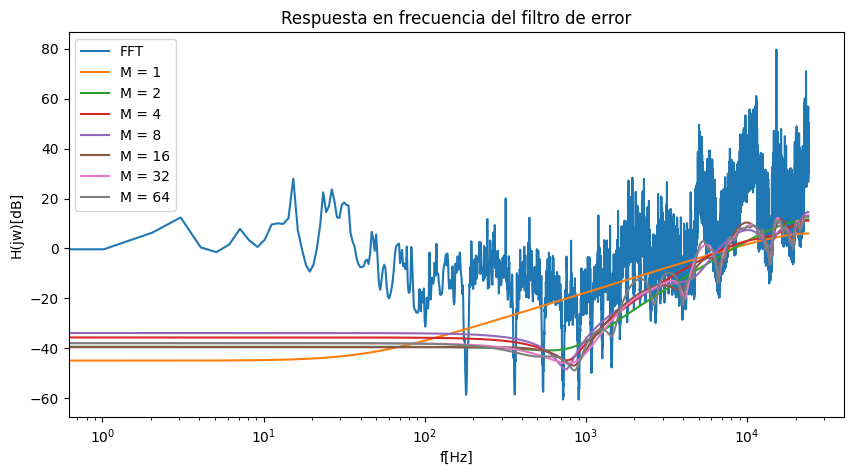

In [75]:
#Señal /a/
graphHandJ(signalA_Norm)

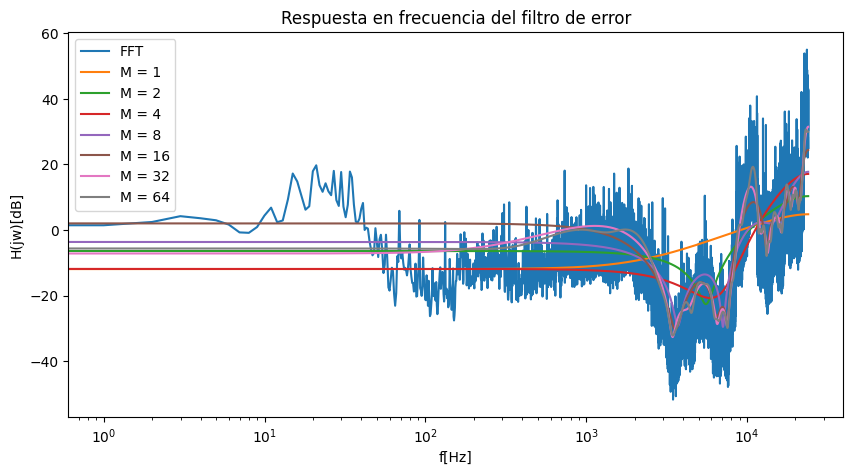

In [74]:
#Señal /sh/
graphHandJ(signalSH_Norm)

Se puede ver que, a medida que se aumenta el orden del filtro, la resolución en frecuencia de la H(jw) aumenta, asemejandose a la FFT de la señal original. Esto da a entender que a medida que se aumente el orden del filtro, este pierde capacidad de eliminar las componentes predecibles de la señal. Esto podría traducirse en una predicción ineficiente y que el filtro está sobreajustado.

Puede verse además que esto ocurre una vez superado (en términos de M) el primer codo, el único en caso de /sh/. Esto comprueba que, a partir de ese punto, el aumento del orden del filtro no genera una mejora en la predicción.

## Resintetización de la señal de error
Se resintetiza la señal de error para luego filtrarla con el filtro inverso resinteticen la señal de error con el filtro inverso del filtro del error de predicción ā. Se utiliza un valor de M = 25.



In [17]:
M = 25
signalA_a, signalA_a_hat, signalA_Jo = forwardPredictionFilter(signalA_Norm, M)
signalSH_a, signalSH_a_hat, signalSH_Jo = forwardPredictionFilter(signalSH_Norm, M)

errorA = scipy.signal.lfilter([1], signalA_a_hat, signalA_Norm)
errorSH = scipy.signal.lfilter([1], signalSH_a_hat, signalSH_Norm)

resintetizadaA = scipy.signal.lfilter(signalA_a_hat, [1], errorA)
resintetizadaSH = scipy.signal.lfilter(signalA_a_hat, [1], errorSH)

In [18]:
outputFilename = "errorA.wav"
wavfile.write(outputFilename, fs, np.int16(resintetizadaA/(np.max(abs(resintetizadaA)))* 32767))

audio = Audio("errorA.wav")
display(audio)

In [19]:
outputFilename = "singalA.wav"
wavfile.write(outputFilename, fs, np.int16(signalA_Norm/(np.max(abs(signalA_Norm)))* 32767))

audio = Audio("singalA.wav")
display(audio)

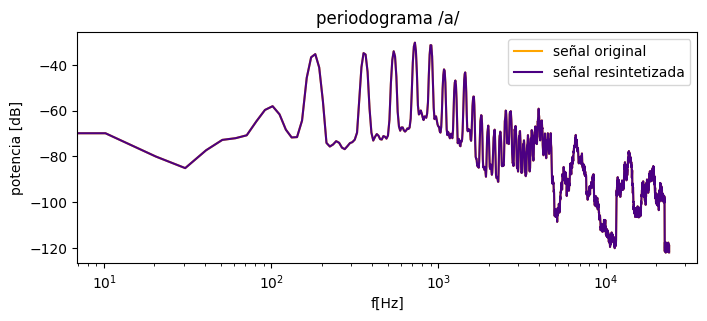

In [99]:
nperseg = int(len(signalA_Norm)/10)  # Tamaño de la ventana para el cálculo del espectro
noverlap = int(nperseg/2)  # Solapamiento entre ventanas

# Calcula el periodograma usando la función welch.
fA, pA_resintetizada = scipy.signal.welch(resintetizadaA, fs, window='parzen', nperseg=nperseg, noverlap=noverlap)
fA, pA = scipy.signal.welch(signalA_Norm, fs, window='parzen', nperseg=nperseg, noverlap=noverlap)

plt.figure(figsize=(8, 3))
plt.title('periodograma /a/')
plt.xlabel('f[Hz]')
plt.ylabel('potencia [dB]')
plt.plot(fA, 10*np.log10(pA_resintetizada), label='señal original', color='orange')
plt.plot(fA, 10*np.log10(pA_resintetizada), label='señal resintetizada', color='indigo')
plt.xscale('log')
plt.legend()
plt.show()

In [20]:
outputFilename = "errorSH.wav"
wavfile.write(outputFilename, fs, np.int16(resintetizadaSH/(np.max(abs(resintetizadaSH)))* 32767))

audio = Audio("errorSH.wav")
display(audio)

In [21]:
outputFilename = "singalSH.wav"
wavfile.write(outputFilename, fs, np.int16(signalSH_Norm/(np.max(abs(signalSH_Norm)))* 32767))

audio = Audio("singalSH.wav")
display(audio)

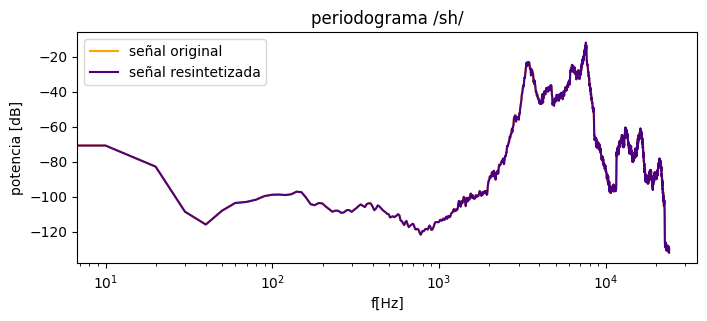

In [100]:
nperseg = int(len(signalSH_Norm)/10)  # Tamaño de la ventana para el cálculo del espectro
noverlap = int(nperseg/2)  # Solapamiento entre ventanas

# Calcula el periodograma usando la función welch.
fSH, pSH_resintetizada = scipy.signal.welch(resintetizadaSH, fs, window='parzen', nperseg=nperseg, noverlap=noverlap)
fSH, pSH = scipy.signal.welch(signalSH_Norm, fs, window='parzen', nperseg=nperseg, noverlap=noverlap)

plt.figure(figsize=(8, 3))
plt.title('periodograma /sh/')
plt.xlabel('f[Hz]')
plt.ylabel('potencia [dB]')
plt.plot(fSH, 10*np.log10(pSH_resintetizada), label='señal original', color='orange')
plt.plot(fSH, 10*np.log10(pSH_resintetizada), label='señal resintetizada', color='indigo')
plt.xscale('log')
plt.legend()
plt.show()

Al obtener la señal de error de predicción a través del filtro de predicción, y luego filtrandola con el inverso se debería obtener la señal original. Al lograr esto se demuestra el correcto funcionamiento del filtro.

Se puede comprobar esto tanto escuchando las señales como viendo las gráficas en el tiempo y las de periodograma.

## Grabación de voz
Se utilizan ventanas de Hann de largo 50ms, con overlap del 50%, para realizar predicción forward para diversos bloques con M = 12. Se utiliza un tren de impulsos de frecuencia 160 Hz como entrada al filtro.

In [22]:
fs, signalVoz = wavfile.read('/content/drive/My Drive/TP3 PASA/audio.wav')
signalVoz = audioToMono(signalVoz)

outputFilename = "audio.wav"
wavfile.write(outputFilename, fs, np.int16(signalVoz/(np.max(abs(signalVoz)))* 32767))

audio = Audio("audio.wav")
display(audio)

In [23]:
signalVoz_Norm = ((signalVoz - np.mean(signalVoz))/np.max(signalVoz))

In [24]:
def trenImpulsos(fs_tren, signal):
  t_tren = np.linspace(0, len(signal), endpoint=False)
  muestras_tren = int(len(signal))

  # Generar un tren de impulsos con más impulsos
  tren = np.zeros(muestras_tren)
  periodo = int(fs / fs_tren)
  for i in range(0, muestras_tren, periodo):
      tren[i] = 1
  return tren

In [25]:
def sintetizeAudio(signal, M):
  largo_Hann = int(0.05 * fs)
  overlap = int(largo_Hann/2)
  hann_w = np.hanning(largo_Hann)
  fs_tren = 160
  tren = trenImpulsos(fs_tren, signal)
  vozSintetizada = np.zeros(len(signal))
  max_range = len(signal) - largo_Hann
  paso = largo_Hann - overlap
  for i in range(0, max_range, paso):
    bloque = signal[i:i + largo_Hann]
    bloque *= hann_w
    signala, signal_a_hat, Jo = forwardPredictionFilter(bloque, M)
    bloqueVoz = scipy.signal.lfilter([1], signal_a_hat, tren[i:i+largo_Hann])
    vozSintetizada[i:i + largo_Hann] += bloqueVoz
  return vozSintetizada

In [26]:
M_hann = 12
vozSintetizada = sintetizeAudio(signalVoz_Norm, M_hann)

outputFilename = "singalVozSintetizada.wav"
wavfile.write(outputFilename, fs, np.int16(vozSintetizada* 32767/(np.max(abs(vozSintetizada)))))

audio = Audio("singalVozSintetizada.wav")
display(audio)

Acá ni idea que poner jiji

Se prueba a continuación con M = 40 para ver las diferencias.

In [27]:
M_hann = 40
vozSintetizada = sintetizeAudio(signalVoz_Norm, M_hann)

outputFilename = "singalVozSintetizada.wav"
wavfile.write(outputFilename, fs, np.int16(vozSintetizada* 32767/(np.max(abs(vozSintetizada)))))

audio = Audio("singalVozSintetizada.wav")
display(audio)

Se nota que con un M mayor se logra entender mejor el audio.